In [1]:
!pip install lightning comet_ml torchmetrics --quiet

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jupyterlab-lsp 4.2.0 requires jupyter-lsp>=2.0.0, but you have jupyter-lsp 1.5.1 which is incompatible.


In [2]:
import os
import sys
import time
from copy import copy
import random

from tqdm import tqdm
import pickle

from PIL import Image
from matplotlib import pyplot as plt

import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from torchvision.transforms import functional as transforms_F
from torchvision.ops import Conv2dNormActivation
from torchmetrics import Accuracy, Recall, F1Score
from lightning import pytorch as pl
from lightning.pytorch.loggers.comet import CometLogger

import pandas as pd
from sklearn.model_selection import train_test_split

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

## Data Trainsformation

In [3]:
INPUT_IMAGE_SIZE = 128
MAX_ORIGINAL_IMAGE_SIDE_TO_SIDE_RATIO = 4/3

In [4]:
# Padding eliminator
def eliminate_pads(image, min_pad_size=10, interpolate_to_original=True):
    assert len(image.shape) == 3
    channels, h, w = image.shape

    image = 1. * image

    def is_uniform(x):
        return torch.pow(x - x.mean(), 2).sum()/x.numel() < 1e-3
    def is_diff_negligible(a, b):
        return torch.pow(a-b, 2).sum()/a.numel() < 1e-3

    # top paddings
    p_top = 1
    if is_uniform(image[:, 0, :]):
        while p_top < h and is_diff_negligible(image[:, 0, :], image[:, p_top, :]):
            p_top += 1
    p_top = p_top if p_top >= min_pad_size else 0

    # bottom paddings
    p_bottom = 1
    if is_uniform(image[:, -1, :]):
        while p_bottom < h and is_diff_negligible(image[:, -1, :], image[:, -1-p_bottom, :]):
            p_bottom += 1
    p_bottom = p_bottom if p_bottom >= min_pad_size else 0

    # left paddings
    p_left = 1
    if is_uniform(image[:, :, 0]):
        while p_left < w and is_diff_negligible(image[:, :, 0], image[:, :, p_left]):
            p_left += 1
    p_left = p_left if p_left >= min_pad_size else 0

    # right paddings
    p_right = 1
    if is_uniform(image[:, :, -1]):
        while p_right < w and is_diff_negligible(image[:, :, -1], image[:, :, -1-p_right]):
            p_right += 1
    p_right = p_right if p_right >= min_pad_size else 0

    # if there is something to crop ...
    if p_top + p_bottom + p_left + p_right != 0:

        # size of the crop
        new_h = max(h - p_top - p_bottom, 2)
        new_w = max(w - p_left - p_right, 2)

        # crop
        y, x = max(0, min(p_top, h - 2)), max(0, min(p_left, w - 2))
        image = transforms_F.crop(image, y, x, new_h, new_w)

        # return to original size if needed
        if interpolate_to_original:
            image = transforms.Resize((h, w), antialias=True)(image)

    return image

In [5]:
def train_pair_transform(im1, im2):

    # Image preprocessor for LunGrayscale128 dataset
    
    assert im1.shape == im2.shape
    assert im1.shape[0] == 1, im1.shape[1] == im1.shape[2] == 128
    
    
    # eliminate borders upon radom
    if random.uniform(0., 1.) > 2/3:
        im1 = eliminate_pads(im1, min_pad_size=6, interpolate_to_original=True)
    if random.uniform(0., 1.) > 2/3:
        im2 = eliminate_pads(im2, min_pad_size=6, interpolate_to_original=True)
    
    # jitter
    transform = transforms.ColorJitter(.3, .2)
    im1 = transform(im1)
    im2 = transform(im2)
    
    # random erase
    transform = transforms.RandomErasing(.5, scale=(0.02, 0.07), value=random.uniform(0., 1.))
    im1 = transform(im1)
    im2 = transform(im2)
    
    aggregated = torch.cat([im1, im2])
    
    return aggregated

In [6]:
def val_pair_transform(im1, im2):

    # Image preprocessor for LunGrayscale128 dataset
    
    assert im1.shape == im2.shape
    assert im1.shape[0] == 1, im1.shape[1] == im1.shape[2] == 128
    
    # eliminate pads
    im1 = eliminate_pads(im1, min_pad_size=6, interpolate_to_original=True)
    im2 = eliminate_pads(im2, min_pad_size=6, interpolate_to_original=True)
    
    aggregated = torch.cat([im1, im2])
    
    return aggregated

In [7]:
def test_pair_transform(im1, im2):
    
    def crop_if_needed(tensor):
        w = tensor.shape[-1]
        h = tensor.shape[-2]
        if max(h/w, w/h) > MAX_ORIGINAL_IMAGE_SIDE_TO_SIDE_RATIO:
            if h > w:
                h = int(w * MAX_ORIGINAL_IMAGE_SIDE_TO_SIDE_RATIO)
            else:
                w = int(h * MAX_ORIGINAL_IMAGE_SIDE_TO_SIDE_RATIO)

            tensor = transforms.CenterCrop((h, w))(tensor)
        return tensor
    
    # grayscale (if applicable)
    try:
        im1 = transforms.Grayscale()(im1)
        im2 = transforms.Grayscale()(im2)
    except Exception:
        ...
    
    # crop if needed
    im1 = crop_if_needed(im1)
    im2 = crop_if_needed(im2)
    
    # eliminate pads
    im1 = eliminate_pads(im1, min_pad_size=6, interpolate_to_original=False)
    im2 = eliminate_pads(im2, min_pad_size=6, interpolate_to_original=False)

    # resize
    transform = transforms.Resize((INPUT_IMAGE_SIZE, INPUT_IMAGE_SIZE), interpolation=transforms.InterpolationMode.BILINEAR, antialias=True)
    im1 = transform(im1)
    im2 = transform(im2)
    
    # aggregate
    aggregated = torch.cat([im1, im2])

    return aggregated

## Dataset

In [8]:
class NDLabeledDataset(Dataset):
    def __init__(
        self,
        train_csv_path,
        train_dir_path,
        pair_transform, # gets two tensors, returns X 
    ):
        if not os.path.exists(train_dir_path):
            raise Exception('This image directory does not exist')
            
        self.metadata = [(row['image_url1'].split('/')[-1], 
                          row['image_url2'].split('/')[-1], 
                          row['is_same']) for idx, row in pd.read_csv(train_csv_path).iterrows()]
        self.dir_path = train_dir_path
        self.pair_transform = pair_transform
        
    
    def __len__(self):
        return len(self.metadata)
    
    def __getitem__(self, i):
        triplet = self.metadata[i]
        im1_path = os.path.join(self.dir_path, str(triplet[0]))
        im2_path = os.path.join(self.dir_path, str(triplet[1]))
        label = triplet[2]
        
        try:
            im1 = transforms.ToTensor()(Image.open(im1_path))
        except:
            im1 = torch.zeros(1, 128, 128)
        
        try:
            im2 = transforms.ToTensor()(Image.open(im2_path))
        except:
            im2 = torch.zeros(1, 128, 128)
        
        return self.pair_transform(im1, im2), 1.*torch.tensor(label)
    
    def set_transform(self, pair_transform):
        self.pair_transform = pair_transform
        
        
    def get_train_val_split(self, val_size, seed=None):
        # In other words, we split set of edges so that
        # if an edge is in graph G
        # all the edges of this graph are in this set.
        # This will ensure that images used in train 
        # and validation datasets are different.
        # We propose greedy algorithm that works
        # fine for datasets with many graphs (e.g. >1000)
        
        desired_val_size = int(len(self.metadata) * val_size)
        
        progress_bar = tqdm(total=desired_val_size, unit='step')
        
        pool = set(self.metadata)
        
        val_metadata = []
        
        while len(val_metadata) < desired_val_size:
            graph = {random.choice(list(pool))}
            edges_to_check = list(graph)
            pool.remove(edges_to_check[0])
            
            while len(edges_to_check) > 0:
                edge_to_check = edges_to_check.pop(0)
                # BFS
                pool_copy = copy(pool)
                for current_edge in pool_copy:
                    if {current_edge[0], current_edge[1]} & {edge_to_check[0], edge_to_check[1]}:
                        # if those edges share a vertex remove the edge from the pool
                        # and add to current graph and edges_to_check
                        edges_to_check.append(current_edge)
                        graph.add(current_edge)
                        pool.remove(current_edge)
            
            for edge in graph:
                val_metadata.append(edge)
            progress_bar.update(len(graph))
        
        train_metadata = list(pool)
        
        train_ds = copy(self)
        val_ds = copy(self)
        train_ds.metadata = train_metadata
        val_ds.metadata = val_metadata
        
        return train_ds, val_ds

In [9]:
class NDTestDataset(Dataset):
    def __init__(
        self,
        test_csv_path,
        test_dir_path,
        pair_transform, # gets two tensors, returns X 
    ):
        
        if not os.path.exists(test_dir_path):
            raise Exception('This image directory does not exist')
        self.metadata_df = pd.read_csv(test_csv_path)
        self.dir_path = test_dir_path
        self.pair_transform = pair_transform
        
    
    def __len__(self):
        return len(self.metadata_df)
    
    def __getitem__(self, i):
        row = self.metadata_df.iloc[i]
        idx = row[0]
        im1_name = str(row[1]).split('/')[-1]
        im2_name = str(row[2]).split('/')[-1]
        im1_path = os.path.join(self.dir_path, im1_name)
        im2_path = os.path.join(self.dir_path, im2_name)
        
        try:
            im1 = transforms.ToTensor()(Image.open(im1_path))
        except:
            im1 = torch.zeros(3, 256, 256)
            print(f'Item {i}-1, idx {idx}, {im1_path} cannot be loaded')
        if im1.shape[0] != 3:
            print(f'Item {i}-1, idx {idx}, {im1_path} does not have 3 channels, neglecting the rest')
            im1 = im1[:3, :, :]
        
        try:
            im2 = transforms.ToTensor()(Image.open(im2_path))
        except:
            im2 = torch.zeros(3, 256, 256)
            print(f'Item {i}-2, idx {idx}, {im2_path} cannot be loaded')
        if im2.shape[0] != 3:
            print(f'Item {i}-2, idx {idx}, {im2_path} does not have 3 channels, neglecting the rest')
            im2 = im2[:3, :, :]
        
        return idx, self.pair_transform(im1, im2)

In [10]:
dataset = NDLabeledDataset(
    '/kaggle/input/lunreducedgrayscale128metadata/train.csv/train.csv', 
    '/kaggle/input/lunreducedgrayscale128/LunGrayscale128', 
    train_pair_transform
)
# train_dataset, val_dataset = dataset.get_train_val_split(0.1)
train_dataset, val_dataset = copy(dataset), copy(dataset)
with open('/kaggle/input/lunreducedgrayscale128metadata/train_metadata_010.pkl', 'rb') as f:
    train_dataset.metadata = pickle.load(f)
with open('/kaggle/input/lunreducedgrayscale128metadata/val_metadata_010.pkl', 'rb') as f:
    val_dataset.metadata = pickle.load(f)
    
val_dataset.set_transform(val_pair_transform)
        
print(f"Examples:\n\tTrain: {len(train_dataset)}\n\tValidation: {len(val_dataset)}\n\tTotal: {len(dataset)}")
del dataset

Examples:
	Train: 81575
	Validation: 9063
	Total: 90638


In [11]:
# check if any photo is in both train and validation datasets (unacceptable)
train_imgs = set(r[0] for r in train_dataset.metadata) or set(r[1] for r in train_dataset.metadata)
val_imgs = set(r[0] for r in val_dataset.metadata) or set(r[1] for r in val_dataset.metadata)
print(len(train_imgs), len(val_imgs), len(train_imgs & val_imgs))

74636 6953 0


## Render several images

In [12]:
def render_idx(dataset, idx):
    fig, axes = plt.subplots(len(idx), 2, figsize=(10, 4*len(idx)))
    fig.tight_layout()
    
    for i, n in enumerate(idx):
        x1, x2 = dataset[n][0][0], dataset[n][0][1]
        axes[i,0].imshow(x1, cmap='gray')
        axes[i,1].imshow(x2, cmap='gray')
        
        axes[i,0].set_title('Label: ' + str(float(dataset[n][1])))
        

In [13]:
def render_random_pairs(dataset, n):
    idx = [random.randint(0, len(dataset)-1) for _ in range(n)]
    render_idx(dataset, idx)

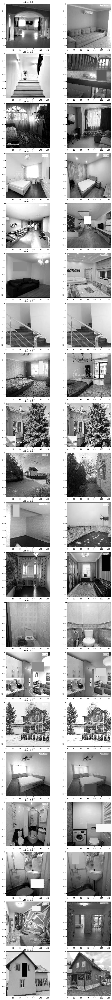

In [14]:
render_random_pairs(train_dataset, 20)

## Model

In [15]:
class Block(nn.Module):
    def __init__(
        self,
        channels_in,
        channels_out,
        kernel_size,
        dilation,
    ):
        super().__init__()


        self.conv_residual = nn.Conv2d(channels_in, channels_out, kernel_size=1)

        self.conv1 = nn.Conv2d(channels_in, channels_in, kernel_size=kernel_size, padding='same', dilation=dilation)
        self.bn1 = nn.BatchNorm2d(channels_in)

        self.conv2 = nn.Conv2d(channels_in, channels_out, kernel_size=kernel_size, padding='same', dilation=dilation)
        self.bn2 = nn.BatchNorm2d(channels_out)

        self.relu = nn.ReLU(inplace=True)

        
    def forward(self, x):
        residual = self.conv_residual(x)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)

        x = x + residual
        x = self.relu(x)
        return x

class Level(nn.Module):
    def __init__(
        self,
        layers_n,  # number of repeated layers
        channels_in,
        channels_hidden,
        channels_out,
        kernel_size,
        dilation,
        prepool
    ):
        super().__init__()

        self.layers = nn.Sequential(
            *(
                Block(
                    channels_in if i == 0 else channels_hidden,
                    channels_out if i + 1 == layers_n else channels_hidden,
                    kernel_size=kernel_size,
                    dilation=dilation,
                )
                for i in range(layers_n)
            )
        )

        self.pool = nn.MaxPool2d(2) if prepool else None

    def forward(self, x):
        if self.pool:
            x = self.pool(x)
        x = self.layers(x)
        return x


class Encoder(nn.Module):
    def __init__(
        self,
        expected_size_in,
        all_channels,
        all_layers,  # must be 1 shorter than all_channels
        all_kernel_sizes,  # number of blocks in length
        all_dilation_rates,   # number of blocks in length
        hierarchical_feature_size,
        hierarchical_feature_channels,
        dense_out,
    ):
        super().__init__()

        assert len(all_channels) - 1 == len(all_layers) == len(all_kernel_sizes) == len(all_dilation_rates)

        self.size_in = expected_size_in
        self.h_feat_size = hierarchical_feature_size

        self.levels = nn.ModuleList(
            Level(n, c_in, c_out, c_out, prepool=(i != 0), kernel_size=kernel, dilation=dilation)
            for i, (c_in, c_out, n, kernel, dilation)
            in enumerate(zip(all_channels, all_channels[1:], all_layers, all_kernel_sizes, all_dilation_rates))
        )

        self.feature_convolutions = nn.ModuleList(
            Conv2dNormActivation(c, hierarchical_feature_channels, kernel_size=1)
            for c in all_channels[1:]
        )

        # TODO you can add final convolution to fuse features

        self.final_pool = nn.AvgPool2d(hierarchical_feature_size//2)
        self.flatten = nn.Flatten()
        self.relu = nn.ReLU(inplace=True)
        self.dense = nn.Linear(2*2*len(all_layers) * hierarchical_feature_channels, dense_out)

    def forward(self, x):
        features = []
        for i, level in enumerate(self.levels):
            x = level(x)
            features.append(nn.AvgPool2d(self.size_in // self.h_feat_size // 2**i)(x))

        unified_features = [self.feature_convolutions[i](feature) for i, feature in enumerate(features)]

        x = torch.cat(unified_features, -3)
        x = self.final_pool(x)
        x = self.flatten(x)
        x = self.relu(x)
        x = self.dense(x)
        return x


class Comparator(nn.Module):
    def __init__(
        self,
        expected_in_dim,
        inner_dim=64
    ):
        super().__init__()
        self.expected_in_dim = expected_in_dim
        
        self.layer_1 = nn.Linear(expected_in_dim, inner_dim)
        self.activation = nn.LeakyReLU()
        self.layer_2 = nn.Linear(inner_dim, 1)


    def forward(self, a, b):
        assert a.shape[-1] == self.expected_in_dim

        x = torch.square(a - b)
        x = self.layer_1(x)
        x = self.activation(x)
        x = self.layer_2(x)
        logit = x.squeeze()
        return logit



class Model(nn.Module):
    def __init__(
        self,
    ):
        super().__init__()

        self.encoder = Encoder(
            128,
            all_channels=[1, 16, 32, 64, 96],
            all_layers=[1, 1, 2, 3],
            all_kernel_sizes=[3, 3, 3, 3],
            all_dilation_rates=[3, 3, 2, 1],
            hierarchical_feature_size=4,
            hierarchical_feature_channels=32,
            dense_out=192,
        )

        self.comparator = Comparator(192)

    def forward(self, x1, x2):
        x1 = self.encoder(x1)
        x2 = self.encoder(x2)
        logit = self.comparator(x1, x2)
        return logit


In [16]:
model = Model()

In [17]:
model.comparator.state_dict()

OrderedDict([('layer_1.weight',
              tensor([[ 0.0005, -0.0343,  0.0673,  ..., -0.0709,  0.0363,  0.0598],
                      [-0.0580, -0.0665, -0.0172,  ..., -0.0439, -0.0205, -0.0136],
                      [ 0.0096,  0.0331, -0.0032,  ..., -0.0141,  0.0253,  0.0535],
                      ...,
                      [-0.0210, -0.0336,  0.0164,  ...,  0.0010, -0.0442, -0.0103],
                      [ 0.0650, -0.0424,  0.0106,  ..., -0.0611,  0.0524, -0.0253],
                      [ 0.0446, -0.0504,  0.0406,  ...,  0.0615, -0.0451, -0.0638]])),
             ('layer_1.bias',
              tensor([-0.0566,  0.0324,  0.0493, -0.0323,  0.0481, -0.0579,  0.0140, -0.0200,
                       0.0301, -0.0007,  0.0035,  0.0703,  0.0305,  0.0230, -0.0446, -0.0058,
                      -0.0261, -0.0400,  0.0112,  0.0170, -0.0422,  0.0719,  0.0209,  0.0447,
                       0.0389, -0.0545, -0.0514,  0.0400, -0.0399,  0.0715, -0.0466,  0.0310,
                      -0.050

In [18]:
a = torch.rand(2, 1, INPUT_IMAGE_SIZE, INPUT_IMAGE_SIZE)
b = torch.rand(2, 1, INPUT_IMAGE_SIZE, INPUT_IMAGE_SIZE)
model(a,b).shape

torch.Size([2])

## Helper

In [19]:
def precision_given_f1_recall(f1, recall, eps=1e-7):
    return (recall * f1 + eps) / (2*recall - f1 + eps)

## Training

In [20]:
class PLModel(pl.LightningModule):
    def __init__(
        self, 
        model,
        criterion,
        lr,
        wd=0,
    ):
        super().__init__()
        
        self.model = model
        self.criterion = criterion
        self.lr = lr
        self.wd = wd
        
        self.val_accuracy = Accuracy('binary')
        self.train_accuracy = Accuracy('binary')
        
        self.val_pos_recall = Recall('binary')
        self.val_neg_recall = Recall('binary')
        self.val_pos_f1 = F1Score('binary')
        self.val_neg_f1 = F1Score('binary')
        
        self.train_pos_recall = Recall('binary')
        self.train_neg_recall = Recall('binary')
        self.train_pos_f1 = F1Score('binary')
        self.train_neg_f1 = F1Score('binary')
        
        self.save_hyperparameters()

        
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=self.lr, weight_decay=self.wd)
    
    def forward(self, x1, x2):
        return self.model(x1, x2)
    
    def training_step(self, batch, batch_idx):
        aggregated, y = batch
        x1 = aggregated[:, :1, :, :]
        x2 = aggregated[:, 1:, :, :]
        
        logit = self(x1, x2)
        
        loss = self.criterion(logit, y)
        self.log('train_loss', loss, sync_dist=True)
        
        preds = 1.*(logit > 0)
        
        self.train_accuracy(preds, y)
        self.train_pos_recall(preds, y)
        self.train_neg_recall(1-preds, 1-y)
        self.train_pos_f1(preds, y)
        self.train_neg_f1(1-preds, 1-y)
        
        return loss

    def validation_step(self, batch, batch_idx):
        aggregated, y = batch
        x1 = aggregated[:, :1, :, :]
        x2 = aggregated[:, 1:, :, :]
        
        logit = self(x1, x2)
        
        loss = self.criterion(logit, y)
        self.log('val_loss', loss, prog_bar=True, sync_dist=True)
        
        preds = 1.*(logit > 0)
        
        self.val_accuracy(preds, y)
        self.val_pos_recall(preds, y)
        self.val_neg_recall(1 - preds, 1 - y)
        self.val_pos_f1(preds, y)
        self.val_neg_f1(1- preds, 1 - y)
        return loss
    
    def on_train_epoch_end(self):
        acc = self.train_accuracy.compute()
        pos_recall = self.train_pos_recall.compute()
        neg_recall = self.train_neg_recall.compute()
        pos_f1 = self.train_pos_f1.compute()
        neg_f1 = self.train_neg_f1.compute()
        self.log('train_acc', acc, sync_dist=True)
        self.log('train_pos_precision', precision_given_f1_recall(pos_f1, pos_recall), sync_dist=True)
        self.log('train_neg_precision', precision_given_f1_recall(neg_f1, neg_recall), sync_dist=True)
        self.log('train_pos_recall', pos_recall, sync_dist=True)
        self.log('train_neg_recall', neg_recall, sync_dist=True)
        self.log('train_pos_f1', pos_f1, sync_dist=True)
        self.log('train_neg_f1', neg_f1, sync_dist=True)
        self.log('train_f1', (3*pos_f1 + neg_f1)/4)
        

    def on_validation_epoch_end(self):
        acc = self.val_accuracy.compute()
        pos_recall = self.val_pos_recall.compute()
        neg_recall = self.val_neg_recall.compute()
        pos_f1 = self.val_pos_f1.compute()
        neg_f1 = self.val_neg_f1.compute()
        self.log('val_acc', acc, sync_dist=True)
        self.log('val_pos_precision', precision_given_f1_recall(pos_f1, pos_recall), sync_dist=True)
        self.log('val_neg_precision', precision_given_f1_recall(neg_f1, neg_recall), sync_dist=True)
        self.log('val_pos_recall', pos_recall, sync_dist=True)
        self.log('val_neg_recall', neg_recall, sync_dist=True)
        self.log('val_pos_f1', pos_f1, sync_dist=True)
        self.log('val_neg_f1', neg_f1, sync_dist=True)
        self.log('val_f1', (3*pos_f1 + neg_f1)/4)

In [21]:
pl_model = PLModel(
    model,
    nn.BCEWithLogitsLoss(pos_weight=torch.tensor(3.)),
    1e-3,
    wd=1e-5,
)

/opt/conda/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:196: UserWarning: Attribute 'model' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['model'])`.
  rank_zero_warn(
/opt/conda/lib/python3.10/site-packages/lightning/pytorch/utilities/parsing.py:196: UserWarning: Attribute 'criterion' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['criterion'])`.
  rank_zero_warn(


In [22]:
checkpoint_callback = pl.callbacks.ModelCheckpoint(
    monitor='val_f1',  # Metric to monitor for saving the best model
    mode='max',          # Whether to minimize or maximize the monitored metric
    filename='best_model.pt',  # Name of the saved checkpoint file
    save_top_k=3,         # Save only the best model (set to 3 to save top 3, for example)
    verbose=True,
    dirpath='/kaggle/working/'
)

In [23]:
logger = CometLogger(
    api_key='VHZ1D3GixsI0P9LRnDFEHYrAG',
    project_name='hackathon_lun_reduced',
    experiment_name='128-grayscale-dense-hierarchical-resnet'
)

INFO: CometLogger will be initialized in online mode


In [24]:
logger.log_hyperparams({
    'train_dataset': "LunGrayscale128",
    'input_image_size': INPUT_IMAGE_SIZE,
    'description': "Hierarchical ResNet, val_set 10%, Full dataset, weighted positives"
})

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: tensorboard, keras, torch, tensorflow.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/kaggle/working' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/hotsteel1312/hackathon-lun-reduced/68ef0901ad0e4ec68ba00e2a44de135a



In [25]:
trainer = pl.Trainer(max_epochs=40, val_check_interval=1/2, callbacks=[checkpoint_callback], logger=logger)

INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


In [26]:
train_dataloader = DataLoader(train_dataset, 64, shuffle=True, num_workers=8)
val_dataloader = DataLoader(val_dataset, 64, shuffle=False, num_workers=8)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [27]:
trainer.fit(
    pl_model, 
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader
)

/opt/conda/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:615: UserWarning: Checkpoint directory /kaggle/working exists and is not empty.
  rank_zero_warn(f"Checkpoint directory {dirpath} exists and is not empty.")
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
   | Name             | Type              | Params
--------------------------------------------------------
0  | model            | Model             | 684 K 
1  | criterion        | BCEWithLogitsLoss | 0     
2  | val_accuracy     | BinaryAccuracy    | 0     
3  | train_accuracy   | BinaryAccuracy    | 0     
4  | val_pos_recall   | BinaryRecall      | 0     
5  | val_neg_recall   | BinaryRecall      | 0     
6  | val_pos_f1       | BinaryF1Score     | 0     
7  | val_neg_f1       | BinaryF1Score     | 0     
8  | train_pos_recall | BinaryRecall      | 0     
9  | train_neg_recall | BinaryRecall      | 0     
10 | train_pos_f1     | BinaryF1Score     | 0     
11 | train_neg_f1     | BinaryF

Sanity Checking: 0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Training: 0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Validation: 0it [00:00, ?it/s]

INFO: Epoch 0, global step 637: 'val_f1' reached 0.93473 (best 0.93473), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 0, global step 1274: 'val_f1' reached 0.95075 (best 0.95075), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 1, global step 1912: 'val_f1' reached 0.96210 (best 0.96210), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 1, global step 2549: 'val_f1' reached 0.96529 (best 0.96529), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 2, global step 3187: 'val_f1' reached 0.96913 (best 0.96913), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 2, global step 3824: 'val_f1' reached 0.97207 (best 0.97207), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 3, global step 4462: 'val_f1' reached 0.97393 (best 0.97393), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 3, global step 5099: 'val_f1' reached 0.97594 (best 0.97594), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 4, global step 5737: 'val_f1' reached 0.97726 (best 0.97726), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 4, global step 6374: 'val_f1' reached 0.97854 (best 0.97854), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 5, global step 7012: 'val_f1' reached 0.97963 (best 0.97963), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 5, global step 7649: 'val_f1' reached 0.98026 (best 0.98026), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 6, global step 8287: 'val_f1' reached 0.98107 (best 0.98107), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 6, global step 8924: 'val_f1' reached 0.98192 (best 0.98192), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 7, global step 9562: 'val_f1' reached 0.98288 (best 0.98288), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 7, global step 10199: 'val_f1' reached 0.98313 (best 0.98313), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 8, global step 10837: 'val_f1' reached 0.98390 (best 0.98390), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 8, global step 11474: 'val_f1' reached 0.98449 (best 0.98449), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 9, global step 12112: 'val_f1' reached 0.98502 (best 0.98502), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 9, global step 12749: 'val_f1' reached 0.98534 (best 0.98534), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 10, global step 13387: 'val_f1' reached 0.98559 (best 0.98559), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 10, global step 14024: 'val_f1' reached 0.98600 (best 0.98600), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 11, global step 14662: 'val_f1' reached 0.98643 (best 0.98643), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 11, global step 15299: 'val_f1' reached 0.98667 (best 0.98667), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 12, global step 15937: 'val_f1' reached 0.98703 (best 0.98703), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 12, global step 16574: 'val_f1' reached 0.98737 (best 0.98737), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 13, global step 17212: 'val_f1' reached 0.98773 (best 0.98773), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 13, global step 17849: 'val_f1' reached 0.98793 (best 0.98793), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 14, global step 18487: 'val_f1' reached 0.98815 (best 0.98815), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 14, global step 19124: 'val_f1' reached 0.98845 (best 0.98845), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 15, global step 19762: 'val_f1' reached 0.98864 (best 0.98864), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 15, global step 20399: 'val_f1' reached 0.98884 (best 0.98884), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 16, global step 21037: 'val_f1' reached 0.98905 (best 0.98905), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 16, global step 21674: 'val_f1' reached 0.98909 (best 0.98909), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 17, global step 22312: 'val_f1' reached 0.98920 (best 0.98920), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 17, global step 22949: 'val_f1' reached 0.98926 (best 0.98926), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 18, global step 23587: 'val_f1' reached 0.98943 (best 0.98943), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 18, global step 24224: 'val_f1' reached 0.98959 (best 0.98959), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 19, global step 24862: 'val_f1' reached 0.98977 (best 0.98977), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 19, global step 25499: 'val_f1' reached 0.98986 (best 0.98986), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 20, global step 26137: 'val_f1' reached 0.99001 (best 0.99001), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 20, global step 26774: 'val_f1' reached 0.99013 (best 0.99013), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 21, global step 27412: 'val_f1' reached 0.99031 (best 0.99031), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 21, global step 28049: 'val_f1' reached 0.99034 (best 0.99034), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 22, global step 28687: 'val_f1' reached 0.99050 (best 0.99050), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 22, global step 29324: 'val_f1' reached 0.99061 (best 0.99061), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 23, global step 29962: 'val_f1' reached 0.99073 (best 0.99073), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 23, global step 30599: 'val_f1' reached 0.99087 (best 0.99087), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 24, global step 31237: 'val_f1' reached 0.99094 (best 0.99094), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 24, global step 31874: 'val_f1' reached 0.99101 (best 0.99101), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 25, global step 32512: 'val_f1' reached 0.99111 (best 0.99111), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 25, global step 33149: 'val_f1' reached 0.99118 (best 0.99118), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 26, global step 33787: 'val_f1' reached 0.99129 (best 0.99129), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 26, global step 34424: 'val_f1' reached 0.99134 (best 0.99134), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 27, global step 35062: 'val_f1' reached 0.99139 (best 0.99139), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 27, global step 35699: 'val_f1' reached 0.99150 (best 0.99150), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 28, global step 36337: 'val_f1' reached 0.99160 (best 0.99160), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 28, global step 36974: 'val_f1' reached 0.99172 (best 0.99172), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 29, global step 37612: 'val_f1' reached 0.99183 (best 0.99183), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 29, global step 38249: 'val_f1' reached 0.99191 (best 0.99191), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 30, global step 38887: 'val_f1' reached 0.99194 (best 0.99194), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 30, global step 39524: 'val_f1' reached 0.99203 (best 0.99203), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 31, global step 40162: 'val_f1' reached 0.99212 (best 0.99212), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 31, global step 40799: 'val_f1' reached 0.99219 (best 0.99219), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 32, global step 41437: 'val_f1' reached 0.99227 (best 0.99227), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 32, global step 42074: 'val_f1' reached 0.99234 (best 0.99234), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 33, global step 42712: 'val_f1' reached 0.99242 (best 0.99242), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 33, global step 43349: 'val_f1' reached 0.99248 (best 0.99248), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 34, global step 43987: 'val_f1' reached 0.99254 (best 0.99254), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 34, global step 44624: 'val_f1' reached 0.99261 (best 0.99261), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 35, global step 45262: 'val_f1' reached 0.99264 (best 0.99264), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 35, global step 45899: 'val_f1' reached 0.99269 (best 0.99269), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 36, global step 46537: 'val_f1' reached 0.99274 (best 0.99274), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 36, global step 47174: 'val_f1' reached 0.99280 (best 0.99280), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 37, global step 47812: 'val_f1' reached 0.99286 (best 0.99286), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 37, global step 48449: 'val_f1' reached 0.99292 (best 0.99292), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 38, global step 49087: 'val_f1' reached 0.99297 (best 0.99297), saving model to '/kaggle/working/best_model.pt-v1.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 38, global step 49724: 'val_f1' reached 0.99296 (best 0.99297), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 39, global step 50362: 'val_f1' reached 0.99299 (best 0.99299), saving model to '/kaggle/working/best_model.pt.ckpt' as top 3


Validation: 0it [00:00, ?it/s]

INFO: Epoch 39, global step 50999: 'val_f1' reached 0.99304 (best 0.99304), saving model to '/kaggle/working/best_model.pt-v2.ckpt' as top 3
INFO: `Trainer.fit` stopped: `max_epochs=40` reached.
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml Experiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     url                   : https://www.comet.com/hotsteel1312/hackathon-lun-reduced/68ef0901ad0e4ec68ba00e2a44de135a
COMET INFO:   Metrics [count] (min, max):
COMET INFO:     train_acc [40]           : (0.9511615037918091, 0.9953423142433167)
COMET INFO:     train_f1 [40]            : (0.9370579123497009, 0.9938931465148926)
COMET INFO:     train_loss [1020]        : (2.6395224267616868e-05, 0.7859424948692322)
COMET INFO:     train_neg_f1 [40]        : (0.9629333019256592, 0.996504426

In [28]:
trainer.validate(pl_model, dataloaders=val_dataloader, verbose=True)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: tensorboard, keras, torch, tensorflow.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/kaggle/working' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/hotsteel1312/hackathon-lun-reduced/68ef0901ad0e4ec68ba00e2a44de135a

COMET WARNING: truncated string; too long: 'Model(
  (encoder): Encoder(
    (levels): ModuleList(
      (0): Level(
        (layers): Sequential(
          (0): Block(
            (conv_residual): Conv2d(1, 16, kernel_size=(1, 1), stride=(1, 1))
            (conv1): Conv2d(1, 1, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(3, 3))
   

Validation: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│          val_acc          │    0.9966549873352051     │
│          val_f1           │    0.9930782318115234     │
│         val_loss          │   0.009332938119769096    │
│        val_neg_f1         │    0.9979199171066284     │
│     val_neg_precision     │    0.9995622634887695     │
│      val_neg_recall       │    0.9962829947471619     │
│        val_pos_f1         │    0.9914643168449402     │
│     val_pos_precision     │    0.9848242402076721     │
│      val_pos_recall       │    0.9981945157051086     │
└───────────────────────────┴───────────────────────────┘

COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO: Comet.ml ExistingExperiment Summary
COMET INFO: ---------------------------------------------------------------------------------------
COMET INFO:   Data:
COMET INFO:     display_summary_level : 1
COMET INFO:     url                   : https://www.comet.com/hotsteel1312/hackathon-lun-reduced/68ef0901ad0e4ec68ba00e2a44de135a
COMET INFO:   Metrics:
COMET INFO:     val_acc           : 0.9966549873352051
COMET INFO:     val_f1            : 0.9930782318115234
COMET INFO:     val_loss          : 0.009332938119769096
COMET INFO:     val_neg_f1        : 0.9979199171066284
COMET INFO:     val_neg_precision : 0.9995622634887695
COMET INFO:     val_neg_recall    : 0.9962829947471619
COMET INFO:     val_pos_f1        : 0.9914643168449402
COMET INFO:     val_pos_precision : 0.9848242402076721
COMET INFO:     val_pos_recall    : 0.9981945157051086
COMET INFO:   Others:
COMET INFO:     Cr

[{'val_loss': 0.009332938119769096,
  'val_acc': 0.9966549873352051,
  'val_pos_precision': 0.9848242402076721,
  'val_neg_precision': 0.9995622634887695,
  'val_pos_recall': 0.9981945157051086,
  'val_neg_recall': 0.9962829947471619,
  'val_pos_f1': 0.9914643168449402,
  'val_neg_f1': 0.9979199171066284,
  'val_f1': 0.9930782318115234}]

In [29]:
torch.save(model, 'model.pt')
torch.save(model.state_dict(), 'model_sd.pt')

In [30]:
logger.experiment.log_model("model", "model.pt")
logger.experiment.log_model("model_sd", "model_sd.pt")

COMET WARNING: To get all data logged automatically, import comet_ml before the following modules: tensorboard, keras, torch, tensorflow.
COMET WARNING: As you are running in a Jupyter environment, you will need to call `experiment.end()` when finished to ensure all metrics and code are logged before exiting.
COMET INFO: Couldn't find a Git repository in '/kaggle/working' nor in any parent directory. Set `COMET_GIT_DIRECTORY` if your Git Repository is elsewhere.
COMET INFO: Experiment is live on comet.com https://www.comet.com/hotsteel1312/hackathon-lun-reduced/68ef0901ad0e4ec68ba00e2a44de135a



{'web': 'https://www.comet.com/api/asset/download?assetId=2fd60aadfb814026aea88586e45cefbc&experimentKey=68ef0901ad0e4ec68ba00e2a44de135a',
 'api': 'https://www.comet.com/api/rest/v2/experiment/asset/get-asset?assetId=2fd60aadfb814026aea88586e45cefbc&experimentKey=68ef0901ad0e4ec68ba00e2a44de135a',
 'assetId': '2fd60aadfb814026aea88586e45cefbc'}

## Render wrongly classified validation entries

In [31]:
class Classify:
    def __init__(self, model):
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.model = model.to(self.device)
    
    def __call__(self, x1, x2):
        return self.get_prob(x1, x2) > .5
    
    def get_prob(self, x1, x2):
        assert x1.shape == x2.shape
        while len(x1.shape) < 4:
            x1 = x1.unsqueeze(0)
            x2 = x2.unsqueeze(0)
        
        x1 = x1.to(self.device)
        x2 = x2.to(self.device)
            
        self.model.eval()
        with torch.no_grad():
            return torch.sigmoid(self.model(x1, x2)).item()

In [32]:
def get_wrongly_classified_idx(dataset, classify):
    misclassified = []
    for i in tqdm(range(len(dataset))):
        aggregated, y = dataset[i]
        x1 = aggregated[:1, :, :]
        x2 = aggregated[1:, :, :]
        
        y_hat = classify(x1, x2)
        
        if y_hat != y:
            misclassified.append(i)
    
    return misclassified

In [33]:
def render_wrongly_classified(dataset, misclassified, classify):
    fig, axes = plt.subplots(len(misclassified), 2, figsize=(10, 4*len(misclassified)))
    fig.tight_layout()
    
    for i, n in enumerate(misclassified):
        
        x1, x2 = dataset[n][0][0], dataset[n][0][1]
        axes[i,0].imshow(x1, cmap='gray')
        axes[i,1].imshow(x2, cmap='gray')
        
        axes[i,0].set_title('Idx: ' + str(n) + ' Label: ' + str(float(dataset[n][1])))
        axes[i,1].set_title('Pred: ' + str(float(classify.get_prob(x1, x2))))
        

In [34]:
classify = Classify(model)

In [35]:
misclassified = get_wrongly_classified_idx(val_dataset, classify)

100%|██████████| 9063/9063 [01:35<00:00, 95.19it/s]


In [36]:
len(misclassified)

16

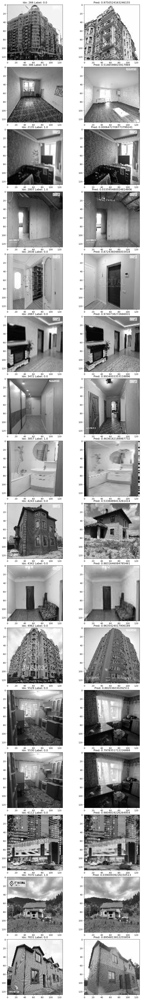

In [37]:
render_wrongly_classified(val_dataset, misclassified[:50], classify)

## Predict

In [38]:
test_dataset = NDTestDataset(
    '/kaggle/input/luntestoriginal/test-data 3.csv',
    '/kaggle/input/luntestoriginal/images',
    test_pair_transform
)

In [39]:
def get_predictions(model, dataset):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model = model.to(device)
    predictions = {'ID': [], 'same': [], 'different': []}
    dataloader = DataLoader(dataset, 32, num_workers=8)
    
    for idx, x in tqdm(dataloader):
        if len(x.shape) == 3:
            x = x.unsqueeze(0)
        
        x = x.to(device)
        
        x1, x2 = x[:, :1, :, :], x[:, 1:, :, :]
        
        logit = model(x1, x2)
        preds = 1*(logit > .0)
        
        for i, pred in zip(idx, preds):
            predictions['ID'].append(int(i))
            predictions['same'].append(int(pred))
            predictions['different'].append(1 - int(pred))
    return predictions
    

In [40]:
predictions = get_predictions(model, test_dataset)

/opt/conda/lib/python3.10/site-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
 45%|████▌     | 320/709 [05:36<02:21,  2.75it/s]

Item 10442-2, idx 10444, /kaggle/input/luntestoriginal/images/975147367.jpg does not have 3 channels, neglecting the rest


 71%|███████   | 504/709 [08:51<03:44,  1.10s/it]

Item 16336-1, idx 16338, /kaggle/input/luntestoriginal/images/924529514.jpg does not have 3 channels, neglecting the rest


100%|██████████| 709/709 [12:11<00:00,  1.03s/it]


In [41]:
submission_df = pd.DataFrame(predictions)

In [42]:
len(submission_df)

22660

In [43]:
submission_df.head()

,ID,same,different
0,2,0,1
1,3,0,1
2,4,0,1
3,5,1,0
4,6,0,1


In [44]:
submission_df.to_csv('test-submission.csv', index=False)